# Syntheteic Data

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys

# append the path of the package to the sys.path
sys.path.append('/sep/haipeng/FWI/seisfwi/')

In [3]:
import os
import time
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from IPython.display import HTML
from tqdm.notebook import tqdm
import matplotlib.gridspec as gridspec

from seisfwi.model import AcousticModel, AcousticModelRBF
from seisfwi.survey import Survey, Source, Receiver, SeismicData, GenericCable
from seisfwi.propagator import AcousticPropagator
from seisfwi.problem import AcousticFWI, WaveformL2Loss, GCLoss
from seisfwi.utils import wavelet, smooth2d, load_misfit
from seisfwi.utils import gmsh_center2d, set_sigma, RBF, interp_data2d
from seisfwi.problem import AcousticInference, AcousticLikelihood, UniformPrior, GaussianPrior
from seisfwi.view import plot_misfit

import arviz as az
import cassm_utils
import plots

In [4]:
# path
path = f'AGU-SEAM-CO2'
os.makedirs(path, exist_ok=True)
os.makedirs(f'{path}/Figure', exist_ok=True)

# Plotting
cmap_range = {'vp': (1500, 3400)}
cmap_range_co2 = {'vp': (-125, 125)}
# cmap_range_co2 = {'vp': (-50, 50)}

plot_args = {
    "orientation": 'vertical',
    "cmap_range": cmap_range ,
    "aspect": 'equal'
}

plot_args_4d = {
    "orientation": 'vertical',
    "cmap_range": cmap_range_co2 ,
    "aspect": 'equal'
}


font_paths = [
    '/homes/sep/haipeng/.local/share/fonts/Helvetica.ttf',
    '/homes/sep/haipeng/.local/share/fonts/Helvetica-Bold.ttf',
    '/homes/sep/haipeng/.local/share/fonts/Helvetica-Oblique.ttf',
    '/homes/sep/haipeng/.local/share/fonts/Helvetica-BoldOblique.ttf'
]
for font_path in font_paths:
    fm.fontManager.addfont(font_path)

plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['Helvetica']
plt.rcParams.update({'font.size': 12})



## Seismic Models and Survey Geometry

In [96]:
# Modeling parameters
ox = 0.0
oz = 0.0
nx = 501
nz = 401
dx = 4.0
dz = 4.0

# Select the part of the model
x0, z0 = 5200, 2500
nx1 = int(x0/dx)
nx2 = nx1 + nx
nz1 = int(z0/dx)
nz2 = nz1 + nz

# True model for modeling obs data (after oil extraction)
vp_bl = np.load('/sep/haipeng/FWI/seisfwi-examples/Proposal-part2-Why/model/SEAM-Monitor-Vp-01-3122-1250-4.0m.npy')[nx1:nx2,nz1:nz2].T
vp_ml = np.load('/sep/haipeng/FWI/seisfwi-examples/Proposal-part2-Why/model/SEAM-Monitor-Vp-501-3122-1250-4.0m.npy')[nx1:nx2,nz1:nz2].T

# resample the model for faster computation
vp_bl = vp_bl[::2,::2]
vp_ml = vp_ml[::2,::2]

dx = 4.0*2
dz = 4.0*2
nx = vp_bl.shape[1]
nz = vp_bl.shape[0]

x = np.arange(ox, nx*dx, dx)
z = np.arange(oz, nz*dz, dz)

In [6]:
vp_bl.shape

(201, 251)

In [7]:
model_bl = AcousticModel(ox, oz, dx, dz, nx, nz, vp = vp_bl, free_surface=False, nabc=20, device='cuda')
model_ml = AcousticModel(ox, oz, dx, dz, nx, nz, vp = vp_ml, free_surface=False, nabc=20, device='cuda')

cuda:0
cuda:0


In [8]:
## Define the source and receiver
nt = 1500
dt = 0.001
f0 = 20.0
amp = 1e7

# Source
source = Source(nt = nt, dt = dt, f0 = f0)

wvlt = wavelet(nt, dt, f0) * amp
wvlt = np.diff(wvlt, prepend=0)
wvlt = np.diff(wvlt, prepend=0)
wvlt = -1.0 * wvlt
        
for isrc in range(3):
    source.add_source([800 * isrc + 100, dx], wvlt, 'pr')

# # Create a set of seismic receiver. Not DAS
# geophone = Receiver(nt = nt, dt = dt)
# for irec in range(nz-10):
#     geophone.add_receiver([850, dx * (irec + 5)], 'pr')

# Create a set of seismic receiver. Not DAS
geophone = Receiver(nt = nt, dt = dt)
for irec in range(nz-20):
    geophone.add_receiver([700, dx * (irec + 5)], 'pr')


# Define the survey
survey = Survey(source=source, receiver=geophone, device='cuda', gpu_num=1)

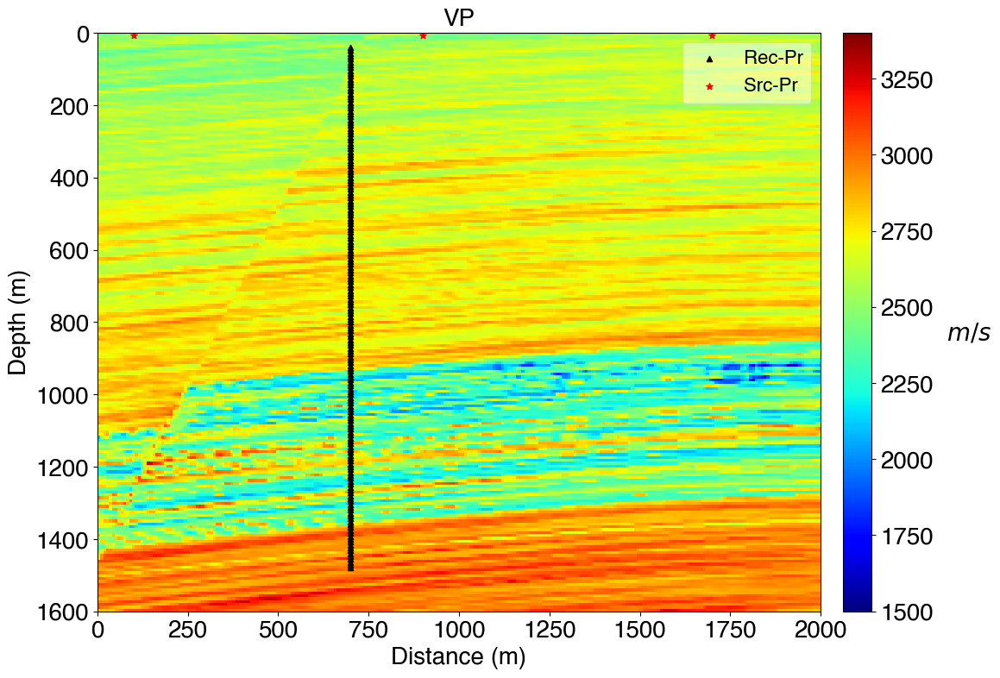

In [9]:
model_bl.plot(survey, **plot_args, fontsize=20, save_path=f'{path}/Figure/true_model_bl.pdf')

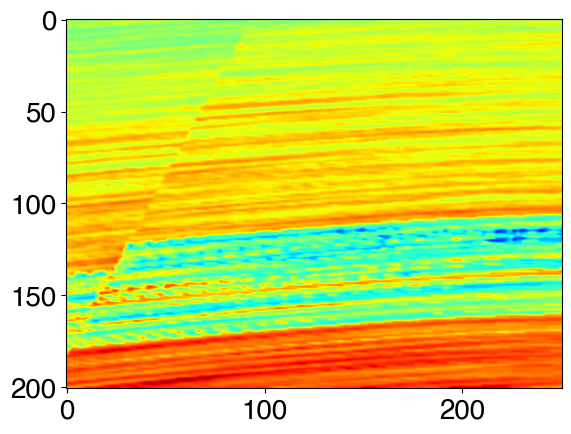

In [10]:
plt.imshow(vp_bl, interpolation='bicubic', cmap='jet', aspect='auto')

cpu


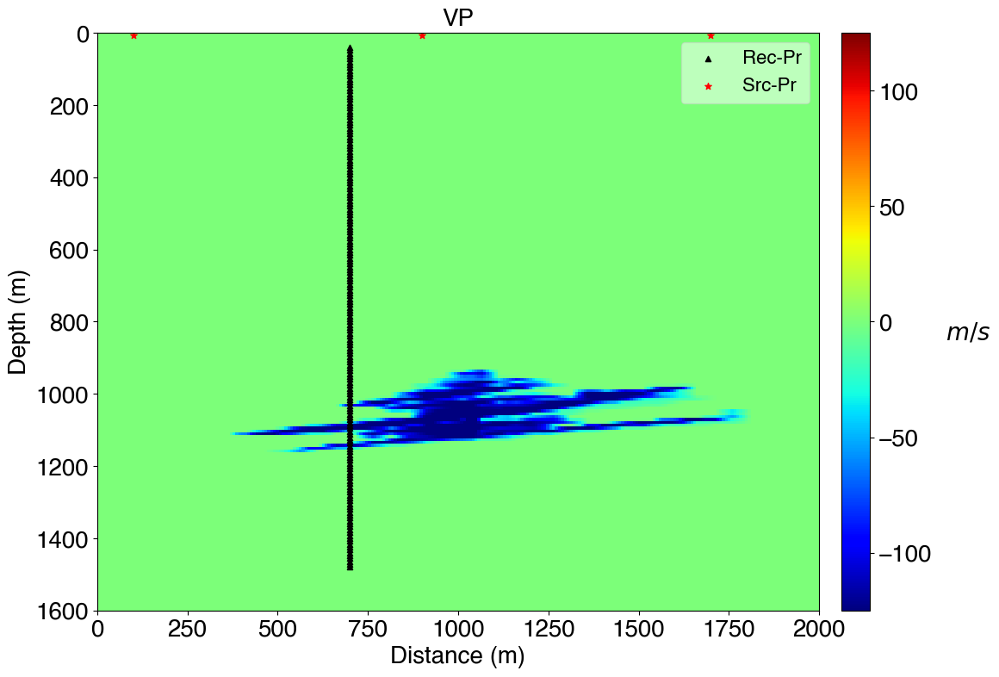

In [19]:
(model_ml-model_bl).plot(survey, **plot_args_4d, fontsize=20, save_path=f'{path}/Figure/true_model_ml.pdf')

## OBS data 

In [20]:
F = AcousticPropagator(model_bl, survey)

dobs_bl = F(model_bl)
dobs_ml = F(model_ml)

dobs_bl.save(f'{path}/dobs_bl.npy')
dobs_ml.save(f'{path}/dobs_ml.npy')

Survey analysis completed: legal survey
free surface: False


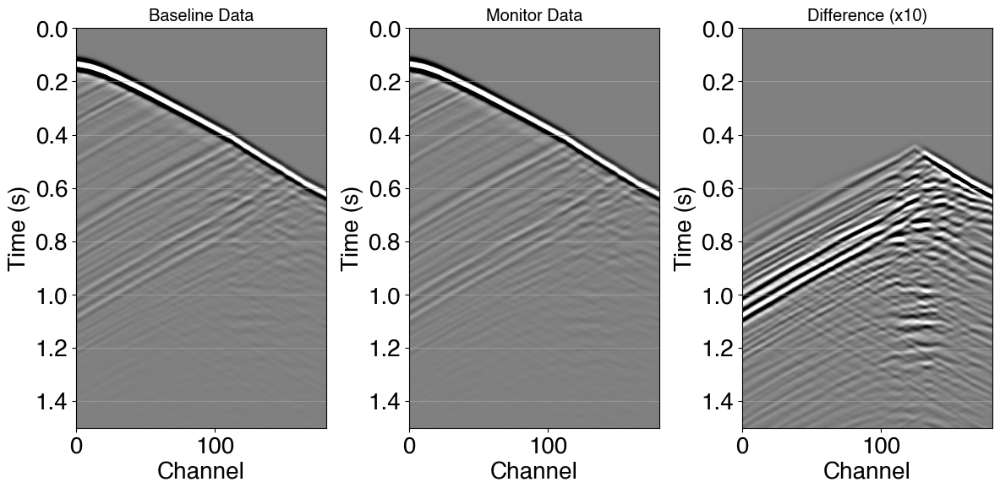

In [21]:
dobs_bl.plot_compare(dobs_ml, shotid=1, comp='pr', clip=99., ratio=10, title=['Baseline Data', 'Monitor Data', 'Difference'], save_path=f'{path}/Figure/dobs_compare.pdf')

## FWI

In [39]:
dx

8.0

In [46]:
# set the Gaussian smooth kernel size (estimated acoording to the data frequency band)
smooth_size = [1, 1]

# set the gradient preconditioning mask
grad_mask = np.ones((nz, nx), dtype=np.float32)
grad_mask[:112,:] = 0.0
grad_mask[ 157:,:] = 0.0
grad_mask[:,:38] = 0.0
grad_mask[:,213:] = 0.0

grad_mask = smooth2d(grad_mask, 5, 5)

In [47]:
# Create a seismic model
model_fwi = AcousticModel(ox, oz, dx, dz, nx, nz,
                     vp = vp_bl, 
                     vp_grad = True, 
                     vp_bound = [1000, 4000],
                     free_surface=False, 
                     mask = grad_mask,
                    #  smooth_size=smooth_size,
                     device='cuda',
                     nabc=20)

cuda:0


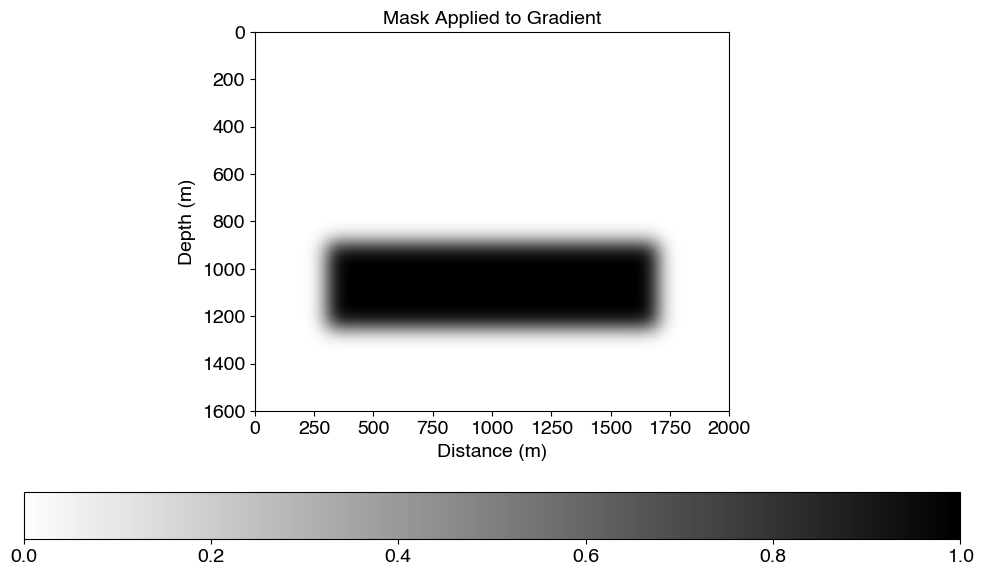

In [48]:
model_fwi.plot_mask()

In [49]:
# Setup propagator
F = AcousticPropagator(model_fwi, survey)

# Setup optimizer
optimizer = torch.optim.LBFGS(model_fwi.parameters(), lr = 0.1, max_iter = 1, 
                              tolerance_change = 1e-4, history_size = 5, 
                              line_search_fn = 'strong_wolfe' )

# Setup misfit function
# misfit = GCLoss
misfit = torch.nn.MSELoss()

# Setup log file
log_file = f'{path}/Acoustic-FWI-ML.log'

# Setup components
weight = {'pr': 1.0}

# Setup acoustic FWI problem
fwi = AcousticFWI(F, model_fwi, optimizer, misfit, dobs_ml, weight)

Survey analysis completed: legal survey
free surface: False


In [50]:
fwi(nshot_per_gpu_per_batch = 8, max_iter = 50, grad_scale = 5.0, log_file=log_file)

**********************************************************
            PyTorch l-BFGS Optimizer                
***********************************************************
     Convergence criterion  :   1.00e-04
     Max iteration          :          1
***********************************************************

   Niter           fk                ngrad          max grad
     1       2.585292e+04                1         1.00e+00
     1       2.585289e+04                1         1.00e+00
     1       2.585289e+04                1         1.00e+00
     1       2.585289e+04                1         1.00e+00
     1       2.585289e+04                1         1.00e+00
     1       2.585289e+04                1         1.00e+00
     1       2.585289e+04                1         1.00e+00
     1       2.585289e+04                1         1.00e+00
     1       2.585289e+04                9         1.00e+00
     2       2.581422e+04               10         9.99e-01
     2       2.577858e+0

cpu


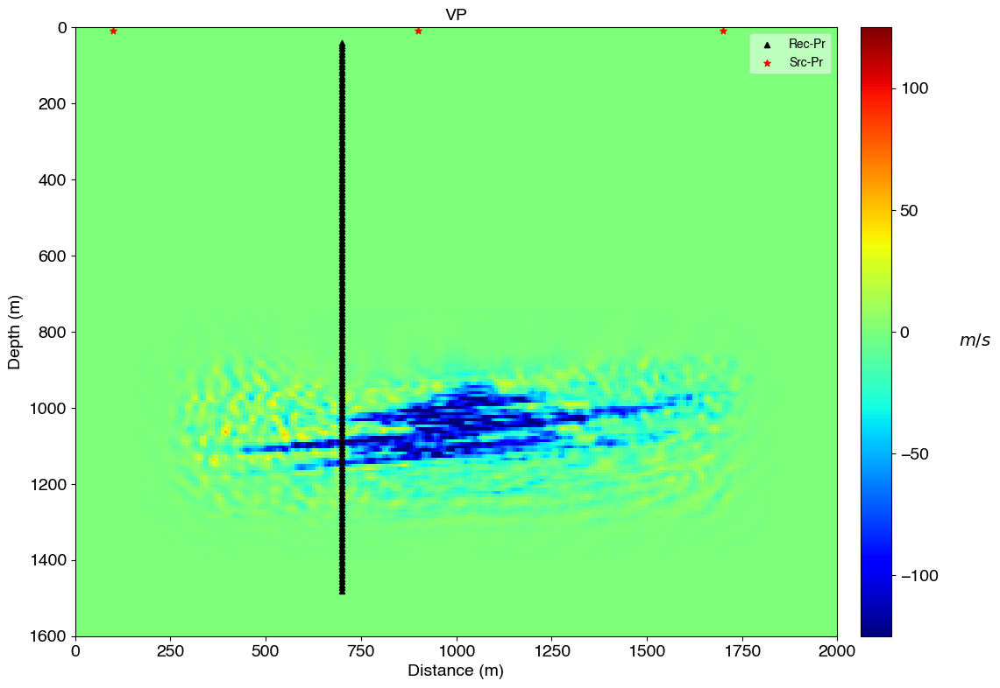

In [51]:
(model_fwi-model_bl).plot(survey, **plot_args_4d, save_path=f'{path}/Figure/model_FWI_FD.pdf')

## Design the RBF model

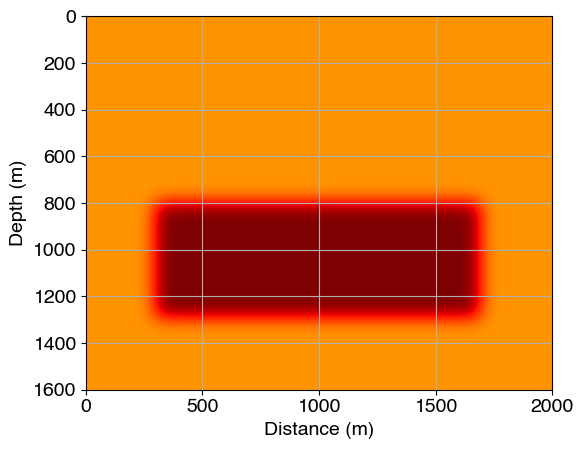

In [52]:
density = np.ones_like(vp_bl)
iz1 = int((800) / dz)
iz2 = int((1300) / dz)
ix1 = int((300) / dx)
ix2 = int((1700) / dx)
density[iz1:iz2, ix1:ix2] = 2.0
density = smooth2d(density, 5, 5)

cassm_utils.plot_2d(x, z, density, cmap='jet')

### Scheme 1

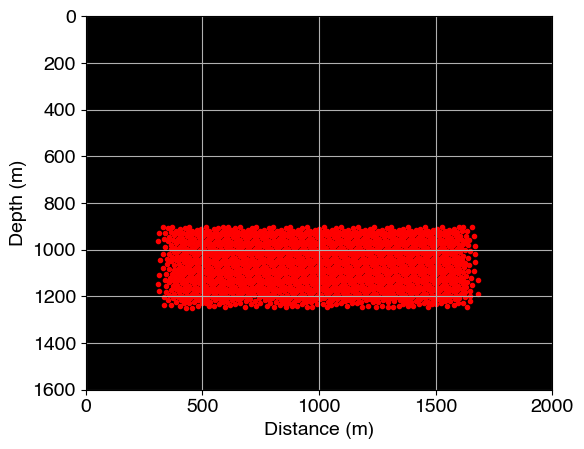

Model space with FD: 50451
Model space with RBF: 1294
Reduction factor: 39


In [53]:
# Define mesh size bounds
mesh_min = 20.0
mesh_max = 100.0

rbf_scheme1, mesh_sizes = gmsh_center2d(density.T, mesh_min, mesh_max, dx)
rbf_scheme1[:, 1] += oz

# only select the centers in the anomaly region
rbf_scheme1 = rbf_scheme1[rbf_scheme1[:,1] > 900 ]
rbf_scheme1 = rbf_scheme1[rbf_scheme1[:,1] < 1250 ]
rbf_scheme1 = rbf_scheme1[rbf_scheme1[:,0] > 300 ]
rbf_scheme1 = rbf_scheme1[rbf_scheme1[:,0] < 1700 ]

# save the mesh centers
np.save(f'{path}/rbf_scheme1.npy', rbf_scheme1)

# plot the mesh centers
cassm_utils.plot_2d(x, z, density*0, rbf_scheme1, cmap='gray', label=False, save_path=f'{path}/Figure/rbf_scheme1.pdf')

print(f"Model space with FD: {nx*nz}")
print(f"Model space with RBF: {rbf_scheme1.shape[0]}")
print(f"Reduction factor: {(nx*nz)/ rbf_scheme1.shape[0]:.0f}")


### Scheme2

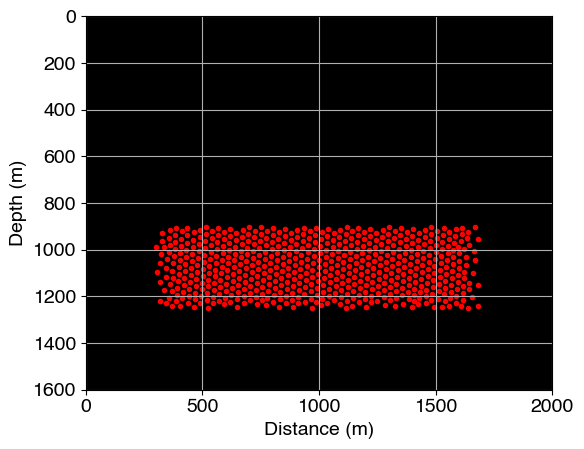

Model space with FD: 50451
Model space with RBF: 598
Reduction factor: 84


In [61]:
# Define mesh size bounds
mesh_min = 30.0
mesh_max = 100.0

rbf_scheme2, mesh_sizes = gmsh_center2d(density.T, mesh_min, mesh_max, dx)
rbf_scheme2[:, 1] += oz
# centers_2d = centers_2d[-3:,:]

# only select the centers in the anomaly region
rbf_scheme2 = rbf_scheme2[rbf_scheme2[:,1] > 900 ]
rbf_scheme2 = rbf_scheme2[rbf_scheme2[:,1] < 1250 ]
rbf_scheme2 = rbf_scheme2[rbf_scheme2[:,0] > 300 ]
rbf_scheme2 = rbf_scheme2[rbf_scheme2[:,0] < 1700 ]

# save the mesh centers
np.save(f'{path}/rbf_scheme2.npy', rbf_scheme2)

# plot the mesh centers
cassm_utils.plot_2d(x, z, density*0, rbf_scheme2, cmap='gray', label=False, save_path=f'{path}/Figure/rbf_scheme2.pdf')

print(f"Model space with FD: {nx*nz}")
print(f"Model space with RBF: {rbf_scheme2.shape[0]}")
print(f"Reduction factor: {(nx*nz)/ rbf_scheme2.shape[0]:.0f}")


In [62]:
rbf_scheme1 = np.load(f'{path}/rbf_scheme1.npy')
theta_int_scheme1 = np.zeros(len(rbf_scheme1))
sigma_scheme1 = set_sigma(rbf_scheme1, 0.9)

model_fwi_rbf_scheme1 = AcousticModelRBF(ox, oz, dx, dz, nx, nz, 
                           centers = rbf_scheme1, 
                           theta_vp = theta_int_scheme1, 
                           sigma = sigma_scheme1,
                           update_theta_vp = True, 
                           vp_bound = [1000, 3500],
                           vp = vp_bl,
                           device='cuda')

Precomputing the RBF ...


In [63]:
# Setup propagator
F = AcousticPropagator(model_fwi_rbf_scheme1, survey)

# Setup optimizer
optimizer = torch.optim.LBFGS(model_fwi_rbf_scheme1.parameters(), lr = 0.1, max_iter = 1, 
                              tolerance_change = 1e-4, history_size = 5, 
                              line_search_fn = 'strong_wolfe' )

# Setup misfit function
# misfit = GCLoss
misfit = torch.nn.MSELoss()


# Setup log file
log_file_rbf = f'{path}/Acoustic-FWI-ML-RBF-Scheme1.log'

# Setup components
weight = {'pr': 1.0}

# Setup acoustic FWI problem
fwi = AcousticFWI(F, model_fwi_rbf_scheme1, optimizer, misfit, dobs_ml, weight)

fwi(nshot_per_gpu_per_batch = 8, max_iter = 50, grad_scale = 5.0, log_file=log_file_rbf)

Survey analysis completed: legal survey
free surface: False
**********************************************************
            PyTorch l-BFGS Optimizer                
***********************************************************
     Convergence criterion  :   1.00e-04
     Max iteration          :          1
***********************************************************

   Niter           fk                ngrad          max grad
     1       2.155322e+03                1         1.00e+00
     1       2.155137e+03                1         1.00e+00
     1       2.153476e+03                1         9.99e-01
     1       2.136549e+03                1         9.90e-01
     1       1.972192e+03                1         8.98e-01
     1       8.688895e+02                1         4.22e-01
     1       8.688895e+02                7         4.22e-01
     2       7.698402e+02                8         3.86e-01
     2       3.118649e+02                8         1.24e-01
     2       3.118649e+0

In [64]:
rbf_scheme2 = np.load(f'{path}/rbf_scheme2.npy')
theta_int_scheme2 = np.zeros(len(rbf_scheme2))
sigma_scheme2 = set_sigma(rbf_scheme2, 0.9)

model_fwi_rbf_scheme2 = AcousticModelRBF(ox, oz, dx, dz, nx, nz, 
                           centers = rbf_scheme2, 
                           theta_vp = theta_int_scheme2, 
                           sigma = sigma_scheme2,
                           update_theta_vp = True, 
                           vp_bound = [1000, 3500],
                           vp = vp_bl,
                           device='cuda')

Precomputing the RBF ...


In [65]:
# Setup propagator
F = AcousticPropagator(model_fwi_rbf_scheme2, survey)

# Setup optimizer
optimizer = torch.optim.LBFGS(model_fwi_rbf_scheme2.parameters(), lr = 0.1, max_iter = 1, 
                              tolerance_change = 1e-4, history_size = 5, 
                              line_search_fn = 'strong_wolfe' )
# Setup misfit function
# misfit = GCLoss
misfit = torch.nn.MSELoss()


# Setup log file
log_file_rbf2 = f'{path}/Acoustic-FWI-ML-RBF-Scheme2.log'

# Setup components
weight = {'pr': 1.0}

# Setup acoustic FWI problem
fwi = AcousticFWI(F, model_fwi_rbf_scheme2, optimizer, misfit, dobs_ml, weight)

fwi(nshot_per_gpu_per_batch = 8, max_iter = 50, grad_scale = 5.0, log_file=log_file_rbf2)

Survey analysis completed: legal survey
free surface: False
**********************************************************
            PyTorch l-BFGS Optimizer                
***********************************************************
     Convergence criterion  :   1.00e-04
     Max iteration          :          1
***********************************************************

   Niter           fk                ngrad          max grad
     1       1.304681e+03                1         1.00e+00
     1       1.304436e+03                1         1.00e+00
     1       1.303082e+03                1         9.99e-01
     1       1.288257e+03                1         9.91e-01
     1       1.215766e+03                1         9.47e-01
     1       6.222502e+02                1         5.99e-01
     1       6.222502e+02                7         5.99e-01
     2       5.407562e+02                8         5.56e-01
     2       1.988513e+02                8         1.69e-01
     2       1.988513e+0

In [66]:
vp_fwi_rbf1 = model_fwi_rbf_scheme1.get_model('vp') - vp_bl
vp_fwi_rbf2 = model_fwi_rbf_scheme2.get_model('vp') - vp_bl
vp_fwi_fd = model_fwi.get_model('vp') - vp_bl
vp_true = vp_ml - vp_bl

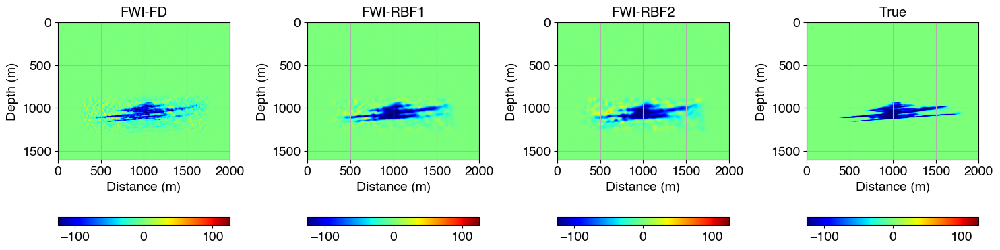

In [67]:
cassm_utils.plot_2d(x, z, [vp_fwi_fd, vp_fwi_rbf1, vp_fwi_rbf2, vp_true], vmin=-125, vmax=125, cmap='jet', title=['FWI-FD', 'FWI-RBF1', 'FWI-RBF2','True'], save_path=f'{path}/Figure/vp_compare.pdf')

### Figure 1

In [111]:
source.get_loc()

array([[ 100.,    8.],
       [ 900.,    8.],
       [1700.,    8.]])

/tmp/ipykernel_35660/1245183729.py:71: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


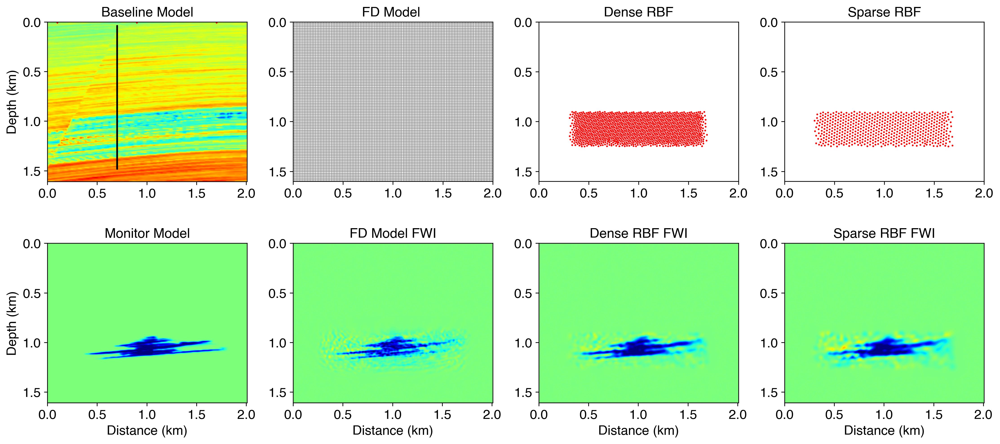

In [112]:
fig, axs = plt.subplots(2, 4, figsize=(15, 7), dpi=300, constrained_layout=True)

extent = [ox, nx*dx/1000, nz*dz/1000, oz]

ax = axs[0, 0]
ax.imshow(vp_bl, interpolation='bicubic', cmap='jet', aspect='equal', vmin=1500, vmax=3400, extent=extent)
ax.set_title('Baseline Model')
ax.set_ylabel('Depth (km)')
# plot geophone
rec_coord = geophone.get_loc('pr')
src_coord = source.get_loc()

ax.scatter(rec_coord[:,0]/1000, rec_coord[:,1]/1000, s=0.8, c='k')
ax.scatter(src_coord[:,0]/1000, src_coord[:,1]/1000, s=0.8, c='r')


ax = axs[0, 1]

for i in range(0, nz, 2):
    ax.plot(x/1000, [i*dx/1000] * nx, color='gray', lw=0.5)

for i in range(0, nx, 2):
    ax.plot([i*dx/1000] * nz, z/1000, color='gray', lw=0.5)

ax.set_xlim([0, x[-1]/1000])
ax.set_ylim([z[-1]/1000, 0])
ax.set_title('FD Model ')
ax.set_aspect('equal', adjustable='box')

ax = axs[0, 2]
ax.scatter(rbf_scheme1[:,0]/1000, rbf_scheme1[:,1]/1000, s=0.8, c='r')
ax.set_xlim([0, x[-1]/1000])
ax.set_ylim([z[-1]/1000, 0])
ax.set_title('Dense RBF')
ax.set_aspect('equal', adjustable='box')

ax = axs[0, 3]
ax.scatter(rbf_scheme2[:,0]/1000, rbf_scheme2[:,1]/1000, s=0.8, c='r')
ax.set_xlim([0, x[-1]/1000])
ax.set_ylim([z[-1]/1000, 0])
ax.set_title('Sparse RBF')
ax.set_aspect('equal', adjustable='box')

ax = axs[1, 0]
ax.imshow(vp_true, interpolation='bicubic', cmap='jet', aspect='equal', vmin=-125, vmax=125, extent=extent)
ax.set_title('Monitor Model')
ax.set_ylabel('Depth (km)')
ax.set_xlabel('Distance (km)')

ax = axs[1, 0]
ax.imshow(vp_true, interpolation='bicubic', cmap='jet', aspect='equal', vmin=-125, vmax=125, extent=extent)
ax.set_title('Monitor Model')
ax.set_ylabel('Depth (km)')
ax.set_xlabel('Distance (km)')

ax = axs[1, 1]
ax.imshow(vp_fwi_fd, interpolation='bicubic', cmap='jet', aspect='equal', vmin=-125, vmax=125, extent=extent)
ax.set_title('FD Model FWI')
ax.set_xlabel('Distance (km)')

ax = axs[1, 2]
ax.imshow(vp_fwi_rbf1, interpolation='bicubic', cmap='jet', aspect='equal', vmin=-125, vmax=125, extent=extent)
ax.set_title('Dense RBF FWI')
ax.set_xlabel('Distance (km)')

ax = axs[1, 3]
ax.imshow(vp_fwi_rbf2, interpolation='bicubic', cmap='jet', aspect='equal', vmin=-125, vmax=125, extent=extent)
ax.set_title('Sparse RBF FWI')
ax.set_xlabel('Distance (km)')

plt.tight_layout()

plt.savefig(f'{path}/Figure/vp_compare.pdf', dpi=300)
plt.show()

In [ ]:
cassm_utils.plot_2d(x, z, [vp_fwi_fd, vp_true], vmin=-125, vmax=125)

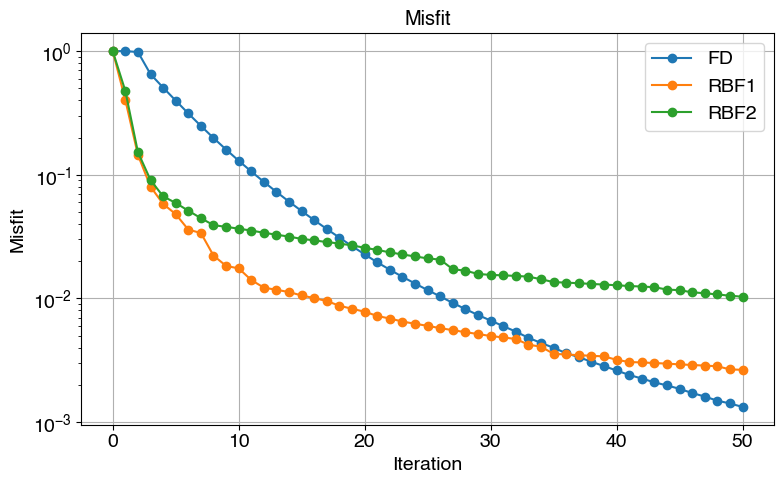

In [113]:
misfit_fd = load_misfit(f'{path}/Acoustic-FWI-ML.log')
misfit_rbf1 = load_misfit(f'{path}/Acoustic-FWI-ML-RBF-Scheme1.log')
misfit_rbf2 = load_misfit(f'{path}/Acoustic-FWI-ML-RBF-Scheme2.log')


plot_misfit([misfit_fd, misfit_rbf1, misfit_rbf2], label=['FD', 'RBF1', 'RBF2'], figname=f'{path}/Figure/misfit_compare.pdf')

## HMC Inference

In [114]:
# Setup initial model
theta_int = np.zeros(len(rbf_scheme1))

model_fwi_hmc = AcousticModelRBF(ox, oz, dx, dz, nx, nz, 
                           centers = rbf_scheme1, 
                           theta_vp = theta_int_scheme1, 
                           sigma = sigma_scheme1,
                           update_theta_vp = True, 
                           vp = vp_bl,
                           vp_bound = [1000, 4000],
                           free_surface=False, 
                           nabc=20, 
                           device='cuda', 
                           set_as_par=False)

# Setup propagator
F = AcousticPropagator(model_fwi_hmc, survey)

# Setup the misfit
misfit = torch.nn.MSELoss()

# Setup components
weight = {'pr': 1.0}

# Setup annealing temperature
temp = 0.0002

# Setup FWI likelihood
fwi_likelihood = AcousticLikelihood(F, model_fwi_hmc, misfit, dobs_ml, weight, temp=temp)


Precomputing the RBF ...
Survey analysis completed: legal survey
free surface: False


In [116]:
# Define the prior
dtype  = fwi_likelihood.model.vp.dtype
device = fwi_likelihood.model.vp.device
ndim   = fwi_likelihood.model.get_ndim()

prior_mean = model_fwi_rbf_scheme1.theta_vp.cpu().detach().numpy()
prior_std  = np.ones_like(prior_mean) * 100.0
prior = GaussianPrior(prior_mean, prior_std, ndim, dtype, device)

In [118]:
# Define the Inference problem
pars = {}
pars['rng_seed'] = 1
pars['num_warmup'] = 200
pars['num_samples'] = 20000
pars['step_size'] = 0.0001
pars['num_steps'] = 10
pars['adapt_step_size'] = True
pars['adapt_mass_matrix'] = False
pars['target_accept_prob'] = 0.65

inference = AcousticInference(pars, fwi_likelihood, prior, method='hmc', save_path=path)

inference

AcousticInference
Method: hmc
Prior: Independent(Normal(loc: torch.Size([1294]), scale: torch.Size([1294])), 1)
Save Path: AGU-SEAM-CO2
Parameters:
	       rng_seed: 1
	     num_warmup: 200
	    num_samples: 20000
	      step_size: 0.0001
	      num_steps: 10
	adapt_step_size: True
	adapt_mass_matrix: False
	target_accept_prob: 0.65

In [119]:
posterior, log_prob = inference(compute_log_prob=True)

******** Acoustic Inference Running ********



Warmup:   0%|          | 3/20200 [00:02,  1.52it/s, step size=2.61e+00, acc. prob=0.333]

Penalty is applied


Sample: 100%|██████████| 20200/20200 [23:03, 14.60it/s, step size=1.26e+00, acc. prob=0.713]



Computing log probability ...


100%|██████████| 20000/20000 [07:53<00:00, 42.25it/s]
/sep/haipeng/miniconda3/envs/pytorch/lib/python3.9/site-packages/pyro/infer/mcmc/util.py:498: UserWarning: Traceback (most recent call last):
  File "/sep/haipeng/miniconda3/envs/pytorch/lib/python3.9/site-packages/pyro/infer/mcmc/util.py", line 496, in wrapped
    val = fn(sample, *args, **kwargs)
  File "/sep/haipeng/miniconda3/envs/pytorch/lib/python3.9/site-packages/pyro/ops/stats.py", line 211, in effective_sample_size
    Rho_monotone = _cummin(Rho_positive)
  File "/sep/haipeng/miniconda3/envs/pytorch/lib/python3.9/site-packages/pyro/ops/stats.py", line 151, in _cummin
    input_tril = input.unsqueeze(0).repeat((N,) + (1,) * input.dim())
torch.cuda.OutOfMemoryError: CUDA out of memory. Tried to allocate 481.96 GiB (GPU 0; 31.75 GiB total capacity; 1.61 GiB already allocated; 28.74 GiB free; 2.12 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  S


Inference Results saved to AGU-SEAM-CO2/FWI-hmc-num-20000-temp-0.0002.nc

******** Acoustic Inference Done ********


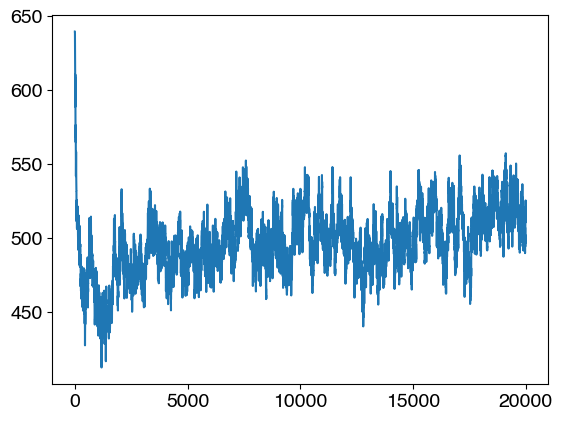

In [120]:
plt.plot(-log_prob)

In [153]:
map_indx = np.argmax(log_prob)

In [121]:
prior_rbf = prior.sample((pars['num_samples'],)).cpu().numpy()

## Analyze the posterior

In [122]:
posterior_az = az.from_pyro(posterior, log_likelihood=False)

/sep/haipeng/miniconda3/envs/pytorch/lib/python3.9/site-packages/pyro/infer/mcmc/util.py:498: UserWarning: Traceback (most recent call last):
  File "/sep/haipeng/miniconda3/envs/pytorch/lib/python3.9/site-packages/pyro/infer/mcmc/util.py", line 496, in wrapped
    val = fn(sample, *args, **kwargs)
  File "/sep/haipeng/miniconda3/envs/pytorch/lib/python3.9/site-packages/pyro/ops/stats.py", line 211, in effective_sample_size
    Rho_monotone = _cummin(Rho_positive)
  File "/sep/haipeng/miniconda3/envs/pytorch/lib/python3.9/site-packages/pyro/ops/stats.py", line 151, in _cummin
    input_tril = input.unsqueeze(0).repeat((N,) + (1,) * input.dim())
torch.cuda.OutOfMemoryError: CUDA out of memory. Tried to allocate 481.96 GiB (GPU 0; 31.75 GiB total capacity; 1.61 GiB already allocated; 28.55 GiB free; 2.31 GiB reserved in total by PyTorch) If reserved memory is >> allocated memory try setting max_split_size_mb to avoid fragmentation.  See documentation for Memory Management and PYTORCH_CUD

In [ ]:
# plots.plot_trace(posterior_az)

In [123]:
# plots.plot_autocorr(posterior_az, pars)

### Compute Statistics

In [125]:
# extract the posterior samples as numpy array
chain = 0
posterior_rbf = posterior_az.posterior['vp'].values[chain]

# extract the Vp model by applying the Jacobian matrix
J = model_fwi_rbf_scheme1.rbf().cpu().detach().numpy()

prior_vp = np.zeros((posterior_rbf.shape[0], nz * nx))
posterior_vp = np.zeros((posterior_rbf.shape[0], nz * nx))

batch_size = 500
for i in tqdm(range(0, posterior_rbf.shape[0], batch_size)):
    # Efficient matrix-vector multiplication
    prior_vp[i:i + batch_size] = prior_rbf[i:i + batch_size]  @ J.T
    posterior_vp[i:i + batch_size] = posterior_rbf[i:i + batch_size] @ J.T  
 
prior_vp = prior_vp.reshape(-1, nz, nx)
posterior_vp = posterior_vp.reshape(-1, nz, nx)

  0%|          | 0/40 [00:00<?, ?it/s]

In [126]:
rbf_mean = np.mean(posterior_rbf, axis=0)
rbf_std  = np.std(posterior_rbf, axis=0)
rbf_med  = np.median(posterior_rbf, axis=0)

vp_mean = np.mean(posterior_vp, axis=0)
vp_std  = np.std(posterior_vp, axis=0)
vp_med  = np.median(posterior_vp, axis=0)

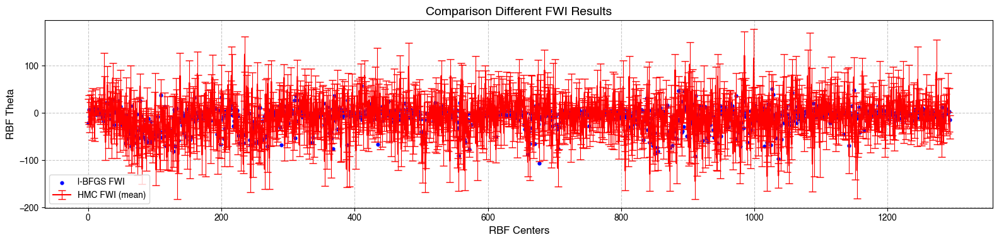

In [129]:
rbf_x = np.arange(len(rbf_scheme1))
rbf_fwi = model_fwi_rbf_scheme1.theta_vp.cpu().detach().numpy()

plt.figure(figsize=(16, 4), dpi=100)
plt.scatter(rbf_x, rbf_fwi, label='l-BFGS FWI', marker='.', color='blue', linewidth=1.5)
plt.errorbar(rbf_x, rbf_mean, yerr=rbf_std, linestyle='-', color='red', label='HMC FWI (mean)', capsize=4, elinewidth=0.8)
# plt.plot(rbf_x, rbf_med, linestyle='-', color='Orange', label='HMC FWI (median)')

plt.legend(loc='lower left', fontsize=10)
plt.title('Comparison Different FWI Results', fontsize=14)
plt.xlabel('RBF Centers', fontsize=12)
plt.ylabel('RBF Theta', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
# plt.xlim([125, 280])

plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout() 
plt.show()


In [164]:
mask_co2 = posterior_vp < -20
mask_mean = np.mean(mask_co2, axis=0)

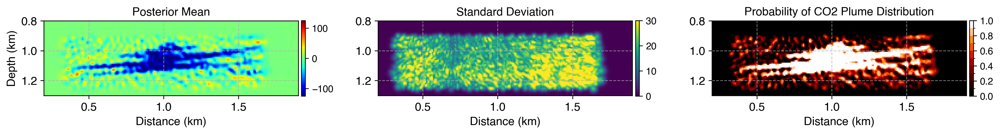

In [198]:
import matplotlib.colors as mcolors


# Define parameters
extent = [ox, nx * dx/1000, nz * dz/1000, oz]
cmap_diff = 'jet' 
cmap_std = 'viridis' 
vmin, vmax = -125, 125 
vmin_std, vmax_std = 0, 30 

# Set up figure and common colorbar settings
fontsize = 12
grid_style = {'linestyle': '--', 'alpha': 0.7}
data_plot = [vp_mean, vp_std]
cmaps = [cmap_diff,  cmap_std]
vmins = [vmin, vmin_std]
vmaxs = [vmax, vmax_std]
titles = ['Posterior Mean', 'Standard Deviation']

plt.figure(figsize=(15, 3.5), dpi=300)

# update font size
plt.rcParams.update({'font.size': fontsize})

for i, data in enumerate(data_plot):
    plt.subplot(1, 3, i+1)
    # data = smooth2d(data, 1, 1)
    im = plt.imshow(data, cmap=cmaps[i], aspect='equal', vmin=vmins[i], vmax=vmaxs[i], extent=extent)
    plt.grid(**grid_style)
    cbar = plt.colorbar(im, shrink=0.35, pad=0.01)
    cbar.ax.tick_params(labelsize=fontsize-2) 
    plt.title(titles[i], fontsize=fontsize)
    
    if i == 0:
        plt.ylabel('Depth (km)', fontsize=fontsize)
    plt.xlabel('Distance (km)', fontsize=fontsize)
    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    plt.xlim([ 200/1000, 1900/1000])
    plt.ylim([1301/1000, 800/1000])
    plt.yticks(np.arange(0.8, 1.4, 0.2), fontsize=fontsize)


# Define the number of discrete levels
n_levels = 10
cmap_discrete = mcolors.ListedColormap(plt.cm.gist_heat(np.linspace(0, 1, n_levels)))
bounds = np.linspace(mask_mean.min(), mask_mean.max(), n_levels + 1)
norm = mcolors.BoundaryNorm(bounds, cmap_discrete.N)

plt.subplot(1, 3, 3)
im = plt.imshow(mask_mean, cmap=cmap_discrete, norm=norm,  extent=extent, aspect='equal')
cbar = plt.colorbar(im, shrink=0.35, pad=0.01)
cbar.ax.tick_params(labelsize=fontsize-2) 
plt.grid(**grid_style)
plt.xlim([ 200/1000, 1900/1000])
plt.ylim([1301/1000, 800/1000])
plt.yticks(np.arange(0.8, 1.4, 0.2), fontsize=fontsize)

plt.title('Probability of CO2 Plume Distribution', fontsize=fontsize)
plt.xlabel('Distance (km)', fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
    
plt.tight_layout()
plt.savefig(f"{path}/Figure/FWI-HMC-Results.pdf", dpi=300, bbox_inches='tight')
plt.show()


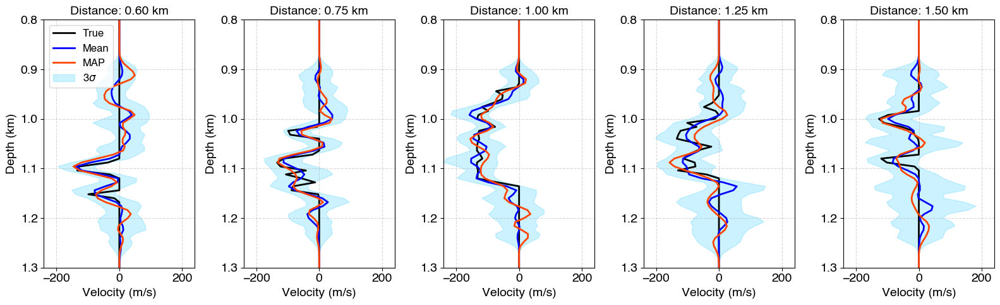

In [201]:
plots.plot_profile(z, vp_true, vp_mean, vp_std, vp_map=posterior_vp[map_indx], dists = [600, 750, 1000, 1250, 1500], save_path=f'{path}/Figure/FWI-HMC-Results-Profile.pdf')


True value at [1000, 1100]: -133.90 m/s
True value at [1008.0, 1100]: -133.90 m/s


/net/server/sep/haipeng/FWI/seisfwi-examples/CASSM/plots.py:216: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  ax_scatter.scatter(ground_true[0], ground_true[1], color='red', marker='*', s=100)


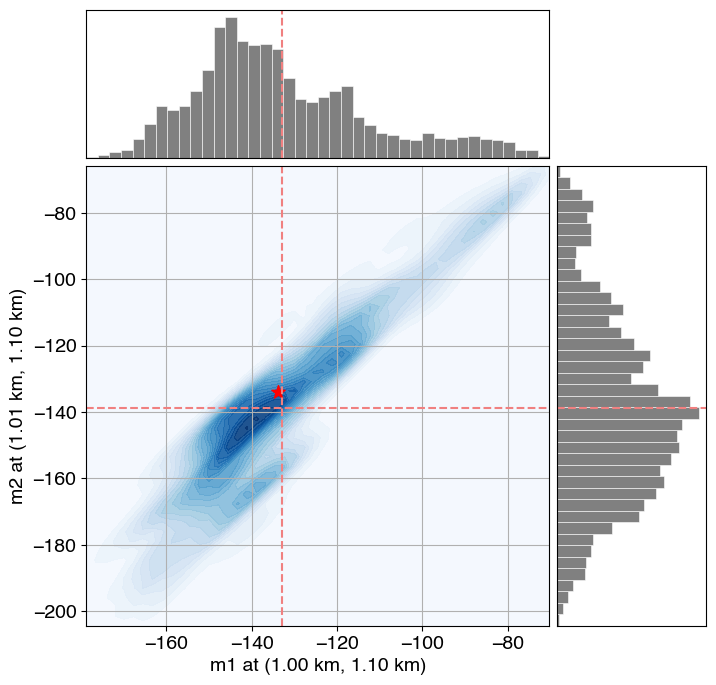

In [255]:
plots.plot_dist(posterior_vp, [1000, 1100], [1000+1*dx, 1100], dx, bins=40, vp_true=vp_true, save_path=f'{path}/Figure/FWI-HMC-Results-Dist1.pdf')

True value at [1000, 1100]: -133.90 m/s
True value at [1064.0, 1100]: -120.29 m/s


/net/server/sep/haipeng/FWI/seisfwi-examples/CASSM/plots.py:216: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  ax_scatter.scatter(ground_true[0], ground_true[1], color='red', marker='*', s=100)


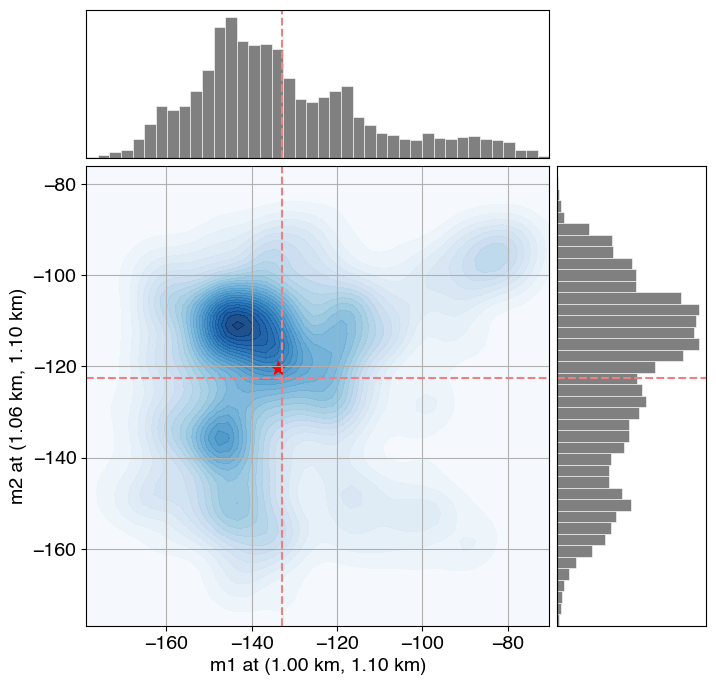

In [256]:
plots.plot_dist(posterior_vp, [1000, 1100], [1000+8*dx, 1100], dx, bins=40, vp_true=vp_true, save_path=f'{path}/Figure/FWI-HMC-Results-Dist2.pdf')

True value at [1000, 1000]: -133.90 m/s
True value at [1000, 976.0]: -118.39 m/s


/net/server/sep/haipeng/FWI/seisfwi-examples/CASSM/plots.py:216: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  ax_scatter.scatter(ground_true[0], ground_true[1], color='red', marker='*', s=100)


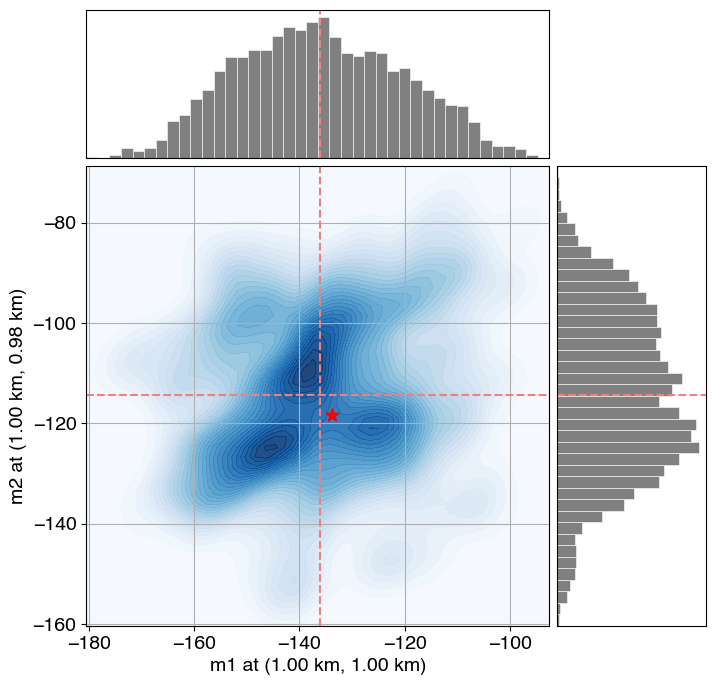

In [257]:
plots.plot_dist(posterior_vp, [1000, 1000], [1000, 1000-3*dx], dx, bins=40, vp_true=vp_true, save_path=f'{path}/Figure/FWI-HMC-Results-Dist3.pdf')

In [138]:
HTML(plots.plot_samples(posterior_vp[::200,:,:]).to_jshtml())

In [ ]:
centers_2d = centers_2d[np.argsort(centers_2d[:,1])]


In [211]:
## Sort the centers
sort_indx = np.argsort(rbf_scheme1[:,1])

posterior_rbf_sort = posterior_rbf[:,sort_indx]

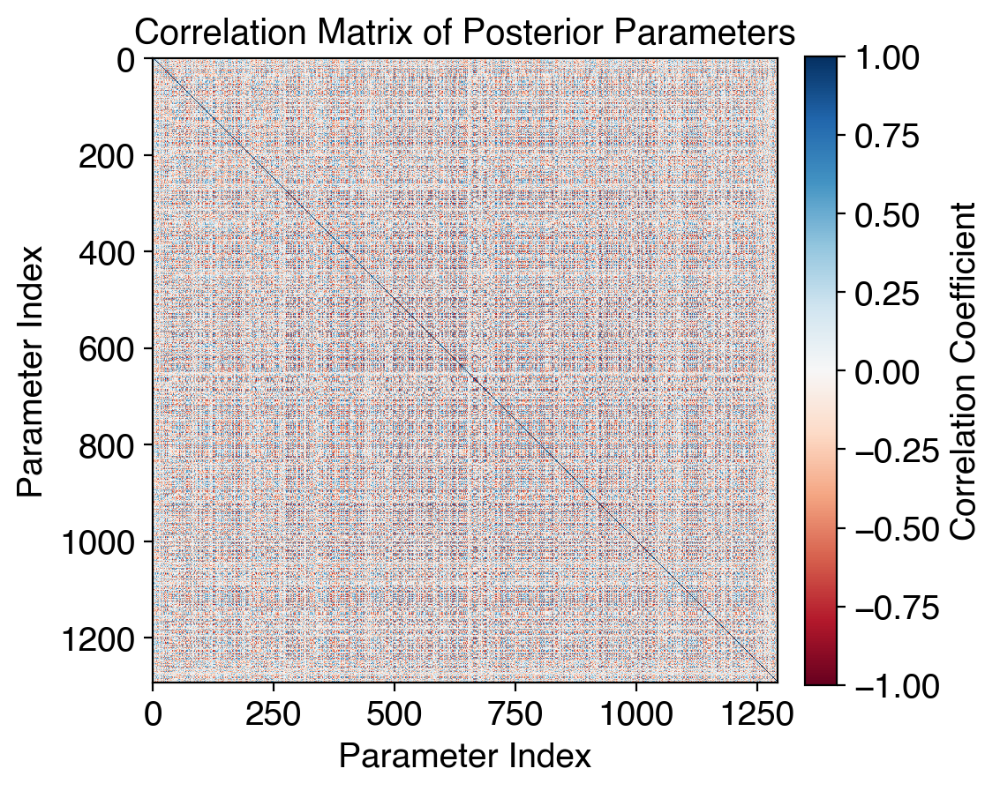

In [213]:
corr_matrix = np.corrcoef(posterior_rbf_sort.reshape(posterior_rbf_sort.shape[0], -1), rowvar=False)

# Visualize the correlation matrix
plt.figure(figsize=(5, 5), dpi=200)
plt.imshow(corr_matrix, cmap="RdBu", interpolation="none", vmin=-1, vmax=1, aspect="equal")
# plt.grid(True, linestyle="--", alpha=0.5)
plt.colorbar(label="Correlation Coefficient", fraction=0.046, pad=0.04)
plt.title("Correlation Matrix of Posterior Parameters")
plt.xlabel("Parameter Index")
plt.ylabel("Parameter Index")
plt.show()

In [ ]:
xxxxxxxx

In [ ]:
# Define parameters
extent = [ox, ox + nx * dx/1000, oz + nz * dz/1000, oz]
cmap_diff = 'jet'
cmap_std = 'viridis'
vmin, vmax = -125, 125
vmin_std, vmax_std = 0, 20
fontsize = 16
aspect = 1
# points = np.int64(np.array([[500, 1125], [1000, 1180], [1500, 950]]) // dx)
points = np.int64(np.array([[750, 1030], [1000, 1100], [1400, 1010]]) // dx)

# set font size
plt.rcParams.update({'font.size': fontsize})
plt.rcParams.update({'axes.labelsize': fontsize})
plt.rcParams.update({'xtick.labelsize': fontsize})
plt.rcParams.update({'ytick.labelsize': fontsize})


def add_colorbar(im, ax, label):
    """Utility function to add colorbars to each plot."""
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = fig.colorbar(im, cax=cax)
    # cbar.set_label(label, fontsize=12)
    
# Create figure layout
fig = plt.figure(figsize=(19, 5.5), dpi=300)
gs = gridspec.GridSpec(2, 3, figure=fig, height_ratios=[1, 0.4])
grid_style = {'linestyle': '--', 'alpha': 0.7}

# Plot True Difference
ax1 = fig.add_subplot(gs[0, 0])
im = ax1.imshow(vp_true, cmap=cmap_diff, vmin=vmin, vmax=vmax, extent=extent, aspect=aspect)
ax1.set_title('True', fontsize=fontsize)
ax1.set_xlabel('Distance (km)', fontsize=fontsize)
ax1.set_ylabel('Depth (km)', fontsize=fontsize)
ax1.grid(**grid_style)
ax1.set_xlim([0.3, 1.850])
ax1.set_ylim([1.300, 0.800])
# cbar = fig.colorbar(im, ax=ax1, shrink=0.8, pad=0.01)
# cbar.set_label('Velocity Change (m/s)', fontsize=12)
# add_colorbar(im, ax1, 'Velocity Change (m/s)')


# Plot Posterior Mean
ax2 = fig.add_subplot(gs[0, 1])
im = ax2.imshow(vp_mean, cmap=cmap_diff, vmin=vmin, vmax=vmax, extent=extent, aspect=aspect)
for point in points:
    ax2.scatter(point[0] * dx/1000, point[1] * dz/1000, color='r', marker='x', s=100)
ax2.set_title('Posterior Mean', fontsize=fontsize)
ax2.set_xlabel('Distance (km)', fontsize=fontsize)
# ax2.set_ylabel('Depth (m)', fontsize=fontsize)
ax2.grid(**grid_style)
ax2.set_xlim([0.3, 1.850])
ax2.set_ylim([1.300, 0.800])
# cbar = fig.colorbar(im, ax=ax2, shrink=0.8, pad=0.01)
# cbar.set_label('Velocity Change (m/s)', fontsize=12)
# add_colorbar(im, ax2, 'Velocity Change (m/s)')


# Plot Uncertainty (Std Dev)
ax3 = fig.add_subplot(gs[0, 2])
im = ax3.imshow(vp_std, cmap=cmap_std, vmin=vmin_std, vmax=vmax_std, extent=extent, aspect=aspect)
ax3.set_title('Uncertainty (Std Dev)', fontsize=fontsize)
ax3.set_xlabel('Distance (km)', fontsize=fontsize)
# ax3.set_ylabel('Depth (m)', fontsize=fontsize)
ax3.grid(**grid_style)
ax3.set_xlim([0.3, 1.850])
ax3.set_ylim([1.300, 0.800])
# cbar = fig.colorbar(im, ax=ax3, shrink=0.8, pad=0.01)
# cbar.set_label('Standard Deviation (m/s)', fontsize=12)
# add_colorbar(im, ax3, 'Velocity Change (m/s)')

# Plot Histograms
for i in range(3):
    ax = fig.add_subplot(gs[1, i])
    ax.hist(hmc_4d[:, points[i, 1], points[i, 0]], bins=50, density=True, alpha=0.5, color='r', label='Posterior')
    ax.axvline(x=vp_true[points[i, 1], points[i, 0]], color='k', linestyle='--', label='True')
    ax.set_title(f'Distribution at ({points[i, 0] * dx}, {points[i, 1] * dz}) m', fontsize=fontsize)
    ax.set_xlabel('Vp (m/s)', fontsize=fontsize)
    # ax.set_ylabel('Density', fontsize=fontsize)
    # remove y-axis labels
    ax.yaxis.set_ticklabels([])
    ax.grid(**grid_style)
    # ax.legend(fontsize=fontsize)

# Final layout adjustments
plt.tight_layout()
plt.subplots_adjust(hspace=0.4, wspace=0.3)
# Save or display
plt.savefig(f"{path}/Figure/FWI-HMC-Results.pdf", dpi=300)
plt.show()


In [ ]:
# Define parameters
extent = [0, nx * dx/1000, nz * dz/1000, 0]
cmap_diff = 'jet'  # Suggested for difference maps
cmap_std = 'viridis'  # Suggested for standard deviation
vmin, vmax = -125, 125  # Limits for difference plots
vmin_std, vmax_std = 0, 30  # Limits for std plot

# Set up figure and common colorbar settings
fontsize = 16
plt.figure(figsize=(18, 5.5), dpi=200)
grid_style = {'linestyle': '--', 'alpha': 0.7}

data_plot = [vp_true, vp_mean, vp_med, vp_std]
cmaps = [cmap_diff, cmap_diff, cmap_diff,  cmap_std]
titles = ['True', 'Posterior Mean', 'Posterior Median', 'Uncertainty (Std Dev)']
vmins = [vmin, vmin, vmin, vmin_std]
vmaxs = [vmax, vmax, vmax, vmax_std]

for i, data in enumerate(data_plot):
    plt.subplot(2, 2, i+1)
    # data = smooth2d(data, 1, 1)
    im = plt.imshow(data, cmap=cmaps[i], aspect='equal', vmin=vmins[i], vmax=vmaxs[i], extent=extent)
    plt.grid(**grid_style)
    plt.colorbar(im, shrink=0.8, pad=0.01)
    plt.title(titles[i], fontsize=fontsize)
    plt.ylabel('Depth (km)', fontsize=fontsize)
    if i > len(data_plot) - 3:
        plt.xlabel('Distance (km)', fontsize=fontsize)
    plt.xlim([300/1000, 1850/1000])
    plt.ylim([1250/1000, 850/1000])
    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)

plt.tight_layout()
plt.savefig(f"{path}/Figure/FWI-HMC-Results.pdf", dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
# Create the plot

fontsize = 14

dists = [600, 800, 1000, 1200, 1400]

plt.figure(figsize=(16, 6), dpi=100)

for i, x in enumerate(dists):
    x_ind = np.int64(x/dx)
    plt.subplot(1, len(dists), i+1)
    # Plot the data with error bars
    # plt.errorbar(vp_mean[:, x_ind], z/1000, xerr=vp_std[:, x_ind], label='Posterior Mean', linestyle='-', color='red', capsize=4, elinewidth=0.8)
    # plt.plot(vp_median[:, x_ind], z/1000, label='Posterior Median', color='deepskyblue', linestyle='-', linewidth=2)
    plt.plot(vp_true[:, x_ind], z/1000, label='True', linestyle='--', color='blue', linewidth=2)
    plt.plot(vp_mean[:, x_ind], z/1000, label='Mean', linestyle='-', color='orangered', linewidth=2)

    plt.xlim([-240, 240])
    plt.ylim([1350/1000, 750/1000])

    vp_3sigma_upper = vp_mean[:, x_ind] + 3 * vp_std[:,x_ind]
    vp_3sigma_lower = vp_mean[:, x_ind] - 3 * vp_std[:,x_ind]

    # plt.plot(vp_3sigma_upper, z/1000, label='±3$\sigma$', color='gray', linestyle='--', linewidth=2)
    # plt.plot(vp_3sigma_lower, z/1000, color='gray', linestyle='--', linewidth=2)

    # plot the 3-sigma region with shaded area
    plt.fill_betweenx(z/1000, vp_3sigma_upper, vp_3sigma_lower, color='deepskyblue', alpha=0.3, label='3$\sigma$')


    plt.xlabel('Velocity (m/s)', fontsize=fontsize)
    plt.ylabel('Depth (km)', fontsize=fontsize)
    plt.title(f'Distance: {x/1000} km', fontsize=fontsize)
    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    plt.grid(True, linestyle='--', alpha=0.5)

    if i == 0:
        plt.legend(fontsize=12, loc='upper left')
        
plt.tight_layout()
plt.savefig(f"{path}/Figure/FWI-HMC-Results-Profile.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# # Cross-plots
# az.plot_pair(hmc_az, var_names=['vp'], kind='kde')
# # plt.savefig(f"{path}/Figure/FWI-HMC-Distribution.pdf", dpi=300)
# plt.show()

In [ ]:
from scipy.stats import gaussian_kde


def plot_dist(hmc_samples, loc1, loc2, dx, bins=40, vp_true=None):
    
    ix1, iz1 = np.int64(loc1[0] // dx), np.int64(loc1[1] // dx)
    ix2, iz2 = np.int64(loc2[0] // dx), np.int64(loc2[1] // dx)

    param1 = hmc_samples[:, iz1, ix1]
    param2 = hmc_samples[:, iz2, ix2]
    
    param1_name = f"Par1: ({loc1[0] / 1000} km, {loc1[1] / 1000} km)"
    param2_name = f"Par2: ({loc2[0] / 1000} km, {loc2[1] / 1000} km)"
    
    if vp_true is not None:
        ground_true = [vp_true[iz1, ix1], vp_true[iz2, ix2]]

        print(f"True value at {loc1}: {ground_true[0]:.2f} m/s")
        print(f"True value at {loc2}: {ground_true[1]:.2f} m/s")

    # Create figure and gridspec
    fig = plt.figure(figsize=(8, 8))
    grid = fig.add_gridspec(4, 4, hspace=0.05, wspace=0.05)

    # Top histogram (first parameter)
    ax_hist_x = fig.add_subplot(grid[0, 0:3])
    ax_hist_x.hist(param1, bins=bins, color='gray', edgecolor='white', linewidth=0.4) # skyblue
    ax_hist_x.set_xlim(param1.min(), param1.max())
    ax_hist_x.set_xticks([])
    ax_hist_x.set_yticks([])
    # plot the mean line
    ax_hist_x.axvline(np.mean(param1), color='lightcoral', linestyle='--', linewidth=1.5)

    # Right histogram (second parameter)
    ax_hist_y = fig.add_subplot(grid[1:4, 3])
    ax_hist_y.hist(param2, bins=bins, color='gray', edgecolor='white', linewidth=0.4, orientation='horizontal') # lightcoral
    ax_hist_y.set_ylim(param2.min(), param2.max())
    ax_hist_y.set_xticks([])
    ax_hist_y.set_yticks([])
    
    # plot the mean lines
    ax_hist_y.axhline(np.mean(param2), color='lightcoral', linestyle='--', linewidth=1.5)

    # Middle scatter plot with PDF
    ax_scatter = fig.add_subplot(grid[1:4, 0:3])

    # Estimate the 2D density
    xy = np.vstack([param1, param2])
    kde = gaussian_kde(xy)
    x_min, x_max = param1.min(), param1.max()
    y_min, y_max = param2.min(), param2.max()
    x, y = np.linspace(x_min, x_max, 50), np.linspace(y_min, y_max, 50)
    xv, yv = np.meshgrid(x, y)
    density = kde(np.vstack([xv.ravel(), yv.ravel()])).reshape(xv.shape)

    # Plot the density as a color map
    density_plot = ax_scatter.contourf(xv, yv, density, levels=30, cmap='Blues', alpha=0.9)
    ax_scatter.set_xlabel(param1_name)
    ax_scatter.set_ylabel(param2_name)
    ax_scatter.grid(True)

    # plot the mean lines
    ax_scatter.axvline(np.mean(param1), color='lightcoral', linestyle='--', linewidth=1.5)
    ax_scatter.axhline(np.mean(param2), color='lightcoral', linestyle='--', linewidth=1.5)

    # plot the true value
    if vp_true is not None:
        ax_scatter.scatter(ground_true[0], ground_true[1], color='red', marker='*', s=100)


    # Adjust the layout for better aesthetics
    plt.tight_layout()
    plt.savefig(f"{path}/Figure/FWI-HMC-Distribution-2D.pdf", dpi=300, bbox_inches='tight')
    plt.show()


In [ ]:
plot_dist(hmc_4d, [1000, 1000], [1000+50, 1000], dx, bins=40, vp_true=vp_true)

In [ ]:
# Adding a chain dimension
nsample = hmc_4d.shape[0]
reshaped_data = hmc_4d.reshape(nsample, nx * nz)[np.newaxis, :, :]

posterior = {"vp": reshaped_data}
dims = {"vp": ["chain", "draw", "index"]}
coords = {"chain": [0], "draw": np.arange(nsample), "index": np.arange(nx * nz)}

vp_4d = az.from_dict(posterior=posterior, dims=dims, coords=coords)

In [ ]:
# Cross-plots
# coords={'vp_dim_0': [0, 1, 2]}
point1 = [1200, 1045]
point2 = [1200+50, 1045]

ix1, iz1 = np.int64(point1[0] // dx), np.int64(point1[1] // dx)
ix2, iz2 = np.int64(point2[0] // dx), np.int64(point2[1] // dx)

dim1 = ix1 + iz1 * nx
dim2 = ix2 + iz2 * nx


# az.plot_pair(vp_4d, var_names=['vp'], kind='kde', coords={'vp_dim_0': [0, 1, 2]})
# # plt.savefig(f"{path}/Figure/FWI-HMC-Distribution.pdf", dpi=300)
# plt.show()

# Plot the pairwise relationships for the selected parameters
az.plot_pair(
    vp_4d.posterior.sel(index=[dim1, dim2]),
    kind="kde",
    marginals=False,
    figsize=(6, 6),
)

plt.scatter(vp_true[iz1, ix1], vp_true[iz2, ix2], color='red', marker='x', s=100)
# Display the plot
plt.show()

In [ ]:
import numpy as np
import arviz as az

# Generate a mock dataset (nsample=5000, nx=50, nz=50)
nsample, nx, nz = 100, 50, 50
data = np.random.randn(nsample, nx, nz)  # Replace with your actual data

reshaped_data = data.reshape(nsample, nx * nz)[np.newaxis, :, :]  # Adding a chain dimension

# Correctly define the ArviZ object with proper dimensions
inference_data = az.from_dict(
    posterior={"vp": reshaped_data},
    dims={"velocity_model": ["chain", "draw", "flattened_index"]},
    coords={
        "chain": [0],  # Single chain
        "draw": np.arange(nsample),  # Corresponding to samples
        "flattened_index": np.arange(nx * nz),  # Flattened velocity model index
    },
)

# Output inference_data for confirmation
inference_data

In [ ]:
# Subset the InferenceData for these parameters
selected_params = [3, 4]  # Python indices (0-based) for 4th and 5th parameters

subset_data = inference_data.posterior.sel(flattened_index=selected_params)

# Plot the pairwise relationships for the selected parameters
az.plot_pair(
    subset_data,
    kind="kde",
    marginals=True,
    figsize=(6, 6),
)

# Display the plot
plt.show()

### Detection

In [ ]:
mask_co2 = hmc_4d < -30
mask_mean = np.mean(mask_co2, axis=0)

In [ ]:
# Define the number of discrete levels
n_levels = 10
cmap_discrete = mcolors.ListedColormap(plt.cm.gist_heat(np.linspace(0, 1, n_levels)))
bounds = np.linspace(mask_mean.min(), mask_mean.max(), n_levels + 1)
norm = mcolors.BoundaryNorm(bounds, jet_discrete.N)


plt.figure(figsize=(10, 5), dpi=300)
plt.imshow(mask_mean, cmap=cmap_discrete, norm=norm,  extent=extent, aspect=aspect)
plt.colorbar(pad=0.01)
plt.title('Probability of CO2 Plume Distribution', fontsize=fontsize)
plt.xlabel('Distance (km)', fontsize=fontsize)
plt.ylabel('Depth (km)', fontsize=fontsize)
plt.xticks(fontsize=fontsize)
plt.yticks(fontsize=fontsize)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig(f"{path}/Figure/CO2-Probability.pdf", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
import cv2

In [ ]:
co2_mean = vp_mean.astype(np.uint8)
co2_med  = vp_median.astype(np.uint8)

co2_true = (model_ml.get_model('vp') - vp_bl).astype(np.uint8)


# # Apply Canny Edge Detection
# edges_true = cv2.Canny(co2_true, threshold1=30, threshold2=100)
# edges_mean = cv2.Canny(co2_mean, threshold1=30, threshold2=100)
# edges_med  = cv2.Canny(co2_med, threshold1=30, threshold2=100)


In [ ]:
# edges_true = region_growing(co2_true, seed, threshold)
# edges_mean = region_growing(co2_mean, seed, threshold)
# edges_med  = region_growing(co2_med, seed, threshold)

# Apply Canny Edge Detection
edges_true = cv2.Canny(co2_true, threshold1=100, threshold2=100)
edges_mean = cv2.Canny(co2_mean, threshold1=100, threshold2=100)
edges_med  = cv2.Canny(co2_med, threshold1=100, threshold2=100)

In [ ]:
hmc_4d.shape

In [ ]:
edges_hmc = np.zeros_like(hmc_4d)

for i in tqdm(range(hmc_4d.shape[0])):
    # edges_hmc[i] = region_growing(hmc_4d[i], seed, threshold)
    edges_hmc[i] = cv2.Canny(hmc_4d[i].astype(np.uint8), threshold1=100, threshold2=100)

In [ ]:
edges_mean = np.mean(edges_hmc, axis=0)
edges_std  = np.std(edges_hmc, axis=0)
edges_median = np.median(edges_hmc, axis=0)


In [ ]:
edges_mean.min(), edges_mean.max()

In [ ]:
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.title("Mean Edge")
plt.imshow(edges_mean, cmap='gray')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("STD Edge")
plt.imshow(edges_std, cmap='gray')

plt.show()


In [ ]:
plt.figure(figsize=(16, 8))
plt.subplot(1, 3, 1)
plt.title("True Edge")
plt.imshow(edges_true, cmap='gray')
plt.colorbar()

plt.subplot(1, 3, 2)
plt.title("Mean Edge")
plt.imshow(edges_mean, cmap='gray')
plt.colorbar()

plt.subplot(1, 3, 3)
plt.title("Median Edge")
plt.imshow(edges_med, cmap='gray')
plt.colorbar()

plt.show()


In [ ]:
plt.imshow(hmc_4d[32000])

In [ ]:
plt.imshow()

In [ ]:
# proposals_burnin = pars['num_samples']
# log_prob_hmc = np.zeros(proposals_burnin)

# for i in tqdm(range(proposals_burnin)):
#     log_prob_hmc[i] = fwi_hmc.log_prob(torch.tensor(hmc_samples[i], dtype=torch.float32, device='cuda'))


In [ ]:
plt.plot(np.sort(log_prob_hmc))

In [ ]:
plt.plot(np.sort(np.exp(log_prob_hmc)))

In [ ]:
# # Define parameters
# extent = [ox, ox + nx * dx, oz + nz * dz, oz]
# cmap_diff = 'jet'  # Suggested for difference maps
# cmap_std = 'seismic'  # Suggested for standard deviation
# vmin, vmax = -50, 50  # Limits for difference plots
# vmin_std, vmax_std = 0, 20  # Limits for std plot

# # Set up figure and common colorbar settings
# plt.figure(figsize=(16, 8))
# grid_style = {'linestyle': '--', 'alpha': 0.7}

# # Plot True Difference
# plt.subplot(2, 3, 1)
# im = plt.imshow(vp_ml - vp_bl, cmap=cmap_diff, aspect='equal', vmin=vmin, vmax=vmax, extent=extent)
# plt.grid(**grid_style)
# plt.colorbar(im, shrink=0.9)
# plt.title('True')
# plt.xlabel('Distance (m)')
# plt.ylabel('Depth (m)')

# # Plot Mean
# plt.subplot(2, 3, 2)
# im = plt.imshow(vp_mean, cmap=cmap_diff, aspect='equal', vmin=vmin, vmax=vmax, extent=extent)
# plt.grid(**grid_style)
# plt.colorbar(im, shrink=0.9)
# plt.title('Posterior Mean')
# plt.xlabel('Distance (m)')
# plt.ylabel('Depth (m)')

# # Plot Median
# plt.subplot(2, 3, 3)
# im = plt.imshow(vp_median, cmap=cmap_diff, aspect='equal', vmin=vmin, vmax=vmax, extent=extent)
# plt.grid(**grid_style)
# plt.colorbar(im, shrink=0.9)
# plt.title('Posterior Median')
# plt.xlabel('Distance (m)')
# plt.ylabel('Depth (m)')

# plt.subplot(2, 3, 4)
# im = plt.imshow(vp_std, cmap=cmap_std, aspect='equal', vmin=vmin_std, vmax=vmax_std, extent=extent)
# plt.grid(**grid_style)
# plt.colorbar(im, shrink=0.9)
# plt.title('Uncertainty (Std Dev)')
# plt.xlabel('Distance (m)')
# plt.ylabel('Depth (m)')

# plt.subplot(2, 3, 5)
# im = plt.imshow(vp_ml - vp_bl-vp_mean, cmap=cmap_std, aspect='equal', vmin=-10, vmax=10, extent=extent)
# plt.grid(**grid_style)
# plt.colorbar(im, shrink=0.9)
# plt.title('True-Mean')
# plt.xlabel('Distance (m)')
# plt.ylabel('Depth (m)')

# plt.subplot(2, 3, 6)
# im = plt.imshow(vp_ml - vp_bl-vp_median, cmap=cmap_std, aspect='equal', vmin=-10, vmax=10, extent=extent)
# plt.grid(**grid_style)
# plt.colorbar(im, shrink=0.9)
# plt.title('True-Median')
# plt.xlabel('Distance (m)')
# plt.ylabel('Depth (m)')


# plt.tight_layout()
# # plt.savefig(f"{path}/Figure/FWI-HMC-Results.pdf", dpi=300)
# plt.show()


In [ ]:
# Generate the trace plot with two subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 4), dpi=300, constrained_layout=True)
axes = np.atleast_2d(axes)  # Ensure axes is 2D


az.plot_trace(
    hmc_az,
    var_names=['vp'],
    divergences=None,
    kind="trace",
    combined=False,
    legend=False,
    compact=True,
    axes=axes 
)

ax1 = axes[0][0]

ax1.set_title(f"Distribution of RBF Model", fontsize=14) 
ax1.set_xlabel("Vp (m/s)", fontsize=12)
ax1.set_ylabel("Counts", fontsize=12)
ax1.grid(True, linestyle="--", alpha=0.5)
ax1.tick_params(axis="both", which="major", labelsize=10)

ax2 = axes[0][1]
ax2.set_title(f"Trace Plot of RBF Model", fontsize=14)
ax2.set_xlabel("Samples", fontsize=12)
ax2.set_ylabel("Vp (m/s)", fontsize=12)
ax2.grid(True, linestyle="--", alpha=0.5)
ax2.tick_params(axis="both", which="major", labelsize=10)

# plt.savefig(f"{path}/Figure/Trace-plot.pdf", dpi=300)
plt.show()

In [ ]:
# # Trace histograms
# coords={'vp_dim_0': [0, 1, 2]}
# az.plot_posterior(hmc_az, var_names=['vp'], kind='hist', bins=50, coords=None)

# # plt.savefig(f"{path}/Figure/FWI-HMC-Posterior.pdf", dpi=300)
# plt.show()

In [ ]:
# # Cross-plots
# az.plot_pair(hmc_az, var_names=['vp'], kind='kde')
# # plt.savefig(f"{path}/Figure/FWI-HMC-Distribution.pdf", dpi=300)
# plt.show()

In [ ]:
# Trace autocorr
# fig, ax = plt.subplots(10, 1, figsize=(10, 8), dpi=300, constrained_layout=True)

az.plot_autocorr(hmc_az, var_names=['vp'], max_lag=pars['num_samples'], combined=False, figsize=(12,16))
plt.tight_layout()
# plt.savefig(f"{path}/Figure/FWI-HMC-Autocorr.pdf", dpi=300)
plt.show()